In [12]:
import numpy as np
import cv2

import PIL.Image as Image
import os

import matplotlib.pylab as plt

import tensorflow as tf
import tensorflow_hub as hub

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

In [13]:
IMAGE_SHAPE = (224,224)
classifier = tf.keras.Sequential([
    hub.KerasLayer("https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4", input_shape = IMAGE_SHAPE+(3,))
])

In [21]:
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "../data",
    labels="inferred",
    label_mode="int",
    class_names=None,
    color_mode="rgb",
    batch_size=32,
    image_size=(224, 224))

# cache_dir indicates where to download data. I specified . which means current directory
# untar true will unzip it

Found 1828 files belonging to 3 classes.


In [84]:
import pathlib
Damage = []
Healthy = []
Other_damage = []
for filepath in pathlib.Path('datasets/MaizeVillage/Maize_Army_Wormy_Damage').glob('**/*.jpg'):
    Damage.append(filepath)
for filepath in pathlib.Path('datasets/MaizeVillage/Maize_Healthy').glob('**/*.jpg'):
    Healthy.append(filepath)
for filepath in pathlib.Path('datasets/MaizeVillage/Maize_Other_Damage').glob('**/*.jpg'):
    Other_damage.append(filepath)

In [85]:
Damage

[WindowsPath('datasets/MaizeVillage/Maize_Army_Wormy_Damage/20211117_140642.jpg'),
 WindowsPath('datasets/MaizeVillage/Maize_Army_Wormy_Damage/20211117_140644.jpg'),
 WindowsPath('datasets/MaizeVillage/Maize_Army_Wormy_Damage/20211117_140651.jpg'),
 WindowsPath('datasets/MaizeVillage/Maize_Army_Wormy_Damage/20211117_140713.jpg'),
 WindowsPath('datasets/MaizeVillage/Maize_Army_Wormy_Damage/20211117_140802.jpg'),
 WindowsPath('datasets/MaizeVillage/Maize_Army_Wormy_Damage/20211117_140809.jpg'),
 WindowsPath('datasets/MaizeVillage/Maize_Army_Wormy_Damage/20211117_140949.jpg'),
 WindowsPath('datasets/MaizeVillage/Maize_Army_Wormy_Damage/20211117_141008.jpg'),
 WindowsPath('datasets/MaizeVillage/Maize_Army_Wormy_Damage/20211117_141010.jpg'),
 WindowsPath('datasets/MaizeVillage/Maize_Army_Wormy_Damage/20211117_141048.jpg'),
 WindowsPath('datasets/MaizeVillage/Maize_Army_Wormy_Damage/20211117_141117.jpg'),
 WindowsPath('datasets/MaizeVillage/Maize_Army_Wormy_Damage/20211117_141128.jpg'),
 Win

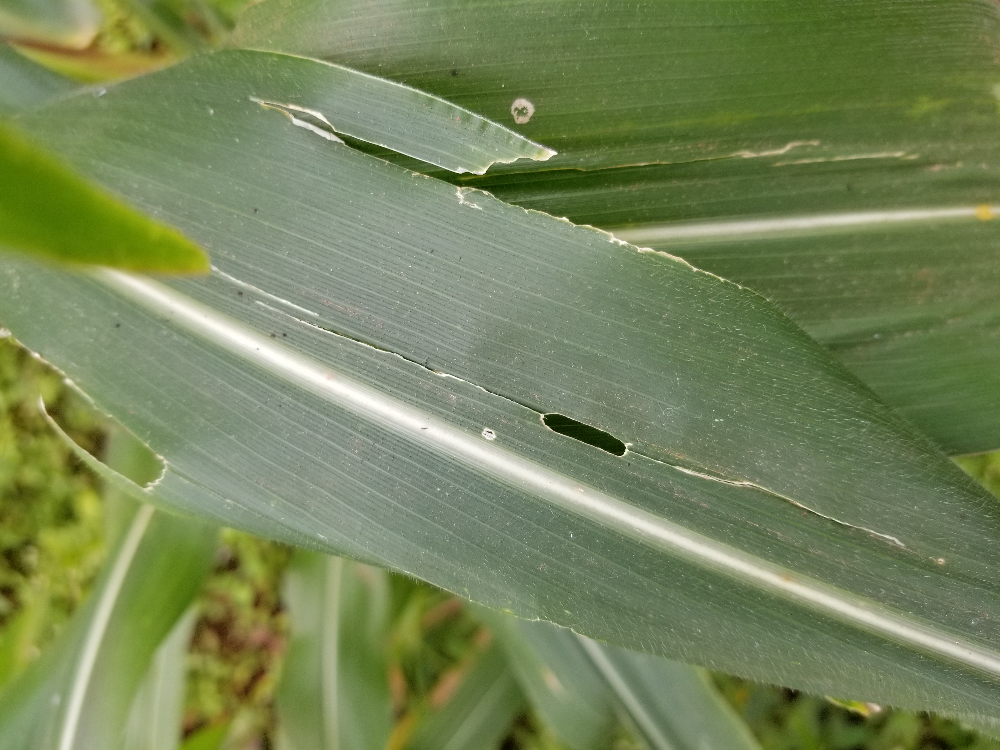

In [88]:
Image.open(str(Damage[0]))

In [92]:
maize_images_dict = {
    'Army_worm': Damage,
    'Healthy': Healthy,
    'Other_damage': Other_damage,
}

In [93]:
maize_labels_dict = {
    'Army_worm': 0,
    'Healthy': 1,
    'Other_damage': 2,
}

In [95]:
img = cv2.imread(str(maize_images_dict['Army_worm'][0]))

In [96]:
img.shape

(4032, 3024, 3)

In [97]:
cv2.resize(img, IMAGE_SHAPE).shape

(224, 224, 3)

In [102]:
X, y = [], []

for maize_name, images in maize_images_dict.items():
    for image in images:
        img = cv2.imread(str(image))
        resized_img = cv2.resize(img, IMAGE_SHAPE)
        X.append(resized_img)
        y.append(maize_labels_dict[maize_name])

In [103]:
X = np.array(X)
y = np.array(y)

In [104]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

In [105]:
X_train_scaled = X_train / 255
X_test_scaled = X_test / 255

In [106]:
X[0].shape

(224, 224, 3)

In [107]:
IMAGE_SHAPE+(3,)

(224, 224, 3)

In [108]:
x0_resized = cv2.resize(X[0], IMAGE_SHAPE)
x1_resized = cv2.resize(X[1], IMAGE_SHAPE)
x2_resized = cv2.resize(X[2], IMAGE_SHAPE)

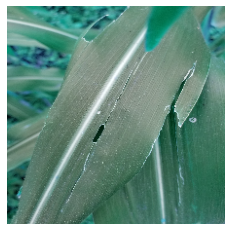

In [109]:
plt.axis('off')
plt.imshow(X[0])

In [110]:
predicted = classifier.predict(np.array([x0_resized, x1_resized, x2_resized]))
predicted = np.argmax(predicted, axis=1)
predicted


array([795, 795, 795], dtype=int64)

In [111]:
image_labels[795]

'shower curtain'

In [112]:
feature_extractor_model = "https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4"

pretrained_model_without_top_layer = hub.KerasLayer(
    feature_extractor_model, input_shape=(224, 224, 3), trainable=False)

In [113]:
num_of_maize = 5

model = tf.keras.Sequential([
  pretrained_model_without_top_layer,
  tf.keras.layers.Dense(num_of_maize)
])

model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_2 (KerasLayer)  (None, 1280)              2257984   
                                                                 
 dense (Dense)               (None, 5)                 6405      
                                                                 
Total params: 2,264,389
Trainable params: 6,405
Non-trainable params: 2,257,984
_________________________________________________________________


In [114]:
model.compile(
  optimizer="adam",
  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['acc'])

model.fit(X_train_scaled, y_train, epochs=5)

Epoch 1/5
43/43 [==============================] - 55s 872ms/step - loss: 0.4899 - acc: 0.8155
Epoch 2/5
43/43 [==============================] - 35s 803ms/step - loss: 0.1829 - acc: 0.9285
Epoch 3/5
43/43 [==============================] - 36s 825ms/step - loss: 0.1296 - acc: 0.9621
Epoch 4/5
43/43 [==============================] - 35s 807ms/step - loss: 0.1059 - acc: 0.9708
Epoch 5/5
43/43 [==============================] - 35s 810ms/step - loss: 0.0871 - acc: 0.9737


In [115]:
model.evaluate(X_test_scaled,y_test)

15/15 [==============================] - 12s 749ms/step - loss: 0.1611 - acc: 0.9475


[0.16114400327205658, 0.9474835991859436]

In [118]:
model.save(f"models/tranfer-learning.h5")